In [7]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [8]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

In [9]:
# Load the SAM model and predictor
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

# vit_b model checkpoint
sam_checkpoint_vitb = "../../experiments/checkpoints/sam_vit_b_01ec64.pth"
model_type = "vit_b"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint_vitb)
sam.to(device=device)

predictor = SamPredictor(sam)


In [10]:
# Load the image
imageid = "201005856_0058_01_0106_P00_01.jpg"

image = cv2.imread("../../data/experimental/building_classes/terraced_houses_unified/" + imageid)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

predictor.set_image(image)

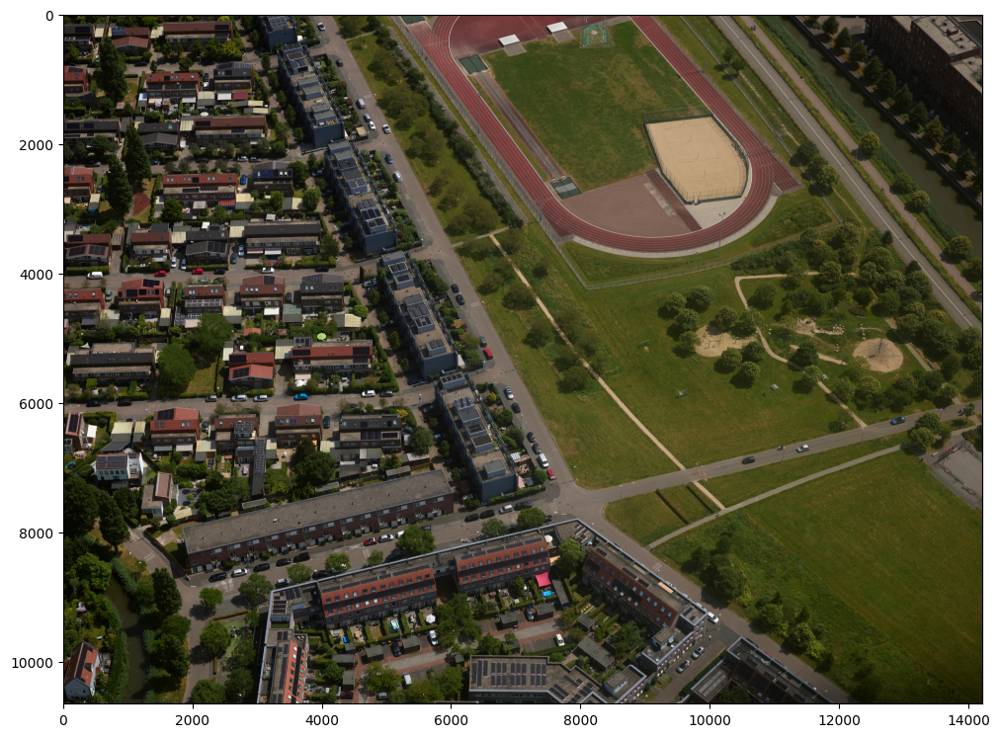

In [11]:
# Show the image
plt.figure(figsize=(12, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

### Import prompt list for imageid from PostgreSQL database

In [36]:
import psycopg2
import os

# Database configuration
DB_CONFIG = {
    "dbname": "aerial_bag_db",
    "user": "postgres",
    "password": os.getenv("DB_PASSWORD"),
    "host": "localhost",
    "port": "5432"
}

# Connect to the database
conn = psycopg2.connect(**DB_CONFIG)
cursor = conn.cursor()

cursor.execute("SELECT ARRAY_AGG(x_prompt) AS x_prompts, ARRAY_AGG(y_prompt) AS y_prompts FROM image_prompts_2d_ta WHERE imageid = %s GROUP BY imageid;", (imageid,))

result = cursor.fetchone()

cursor.close()
conn.close()

if result:
    x_prompts = result[0]
    y_prompts = result[1]

coords = np.array(list(zip(x_prompts, y_prompts)))  # This creates a 2D array
labels = np.array([1] * len(x_prompts))  # Labels (in your case, all 1)

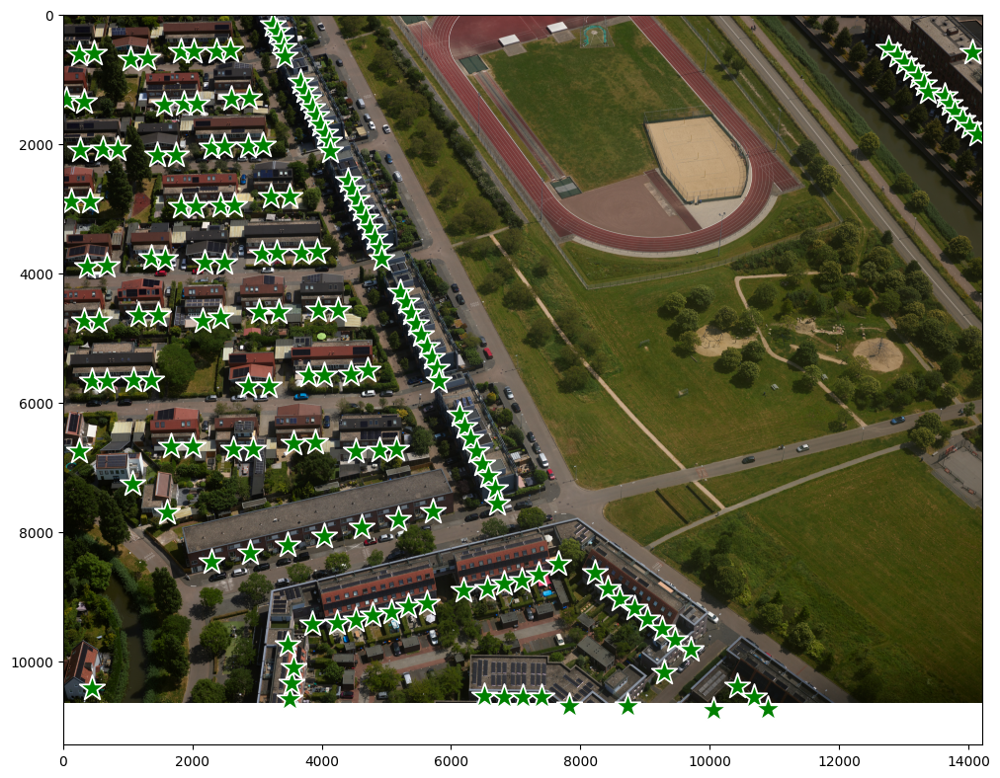

In [37]:
plt.figure(figsize=(12, 10))
plt.imshow(image)
show_points(coords, labels, ax=plt.gca())
plt.axis('on')
plt.show()


In [40]:
def crop_image_with_buffer(image, point, buffer_size=1000):
    x, y = point

    # Calculate the crop boundaries with buffer
    x1 = max(0, x - buffer_size)
    y1 = max(0, y - buffer_size)
    x2 = min(image.shape[1], x + buffer_size)
    y2 = min(image.shape[0], y + buffer_size)

    # Crop the image
    cropped_image = image[y1:y2, x1:x2]

    # Return cropped image and adjusted point (relative to cropped image)
    cropped_point = np.array([[x - x1, y - y1]], dtype=np.float32)
    return cropped_image, cropped_point

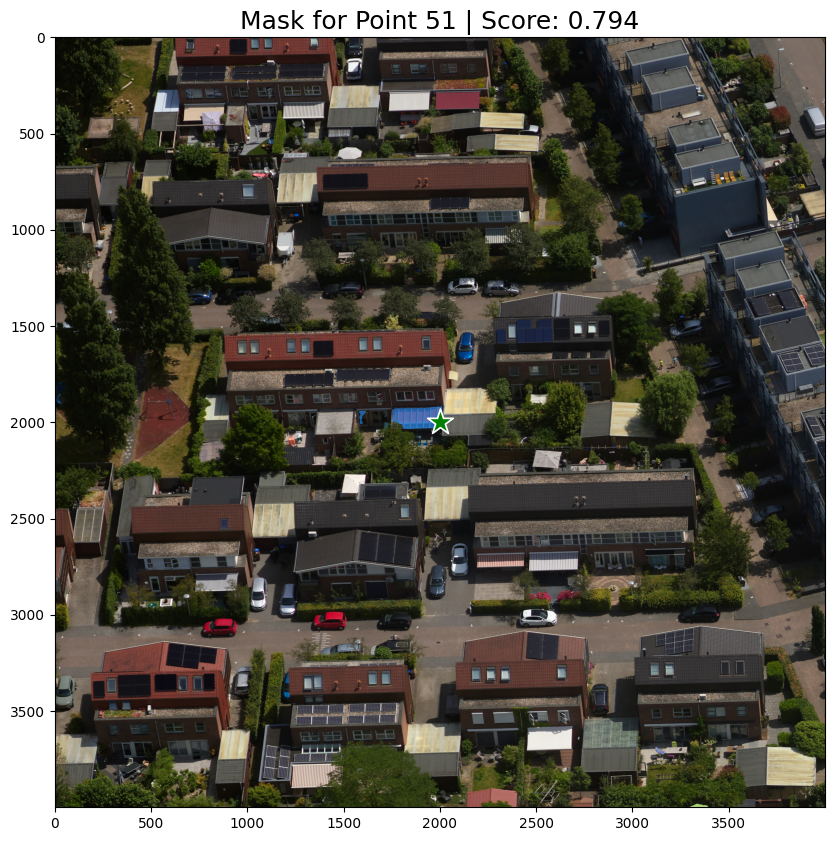

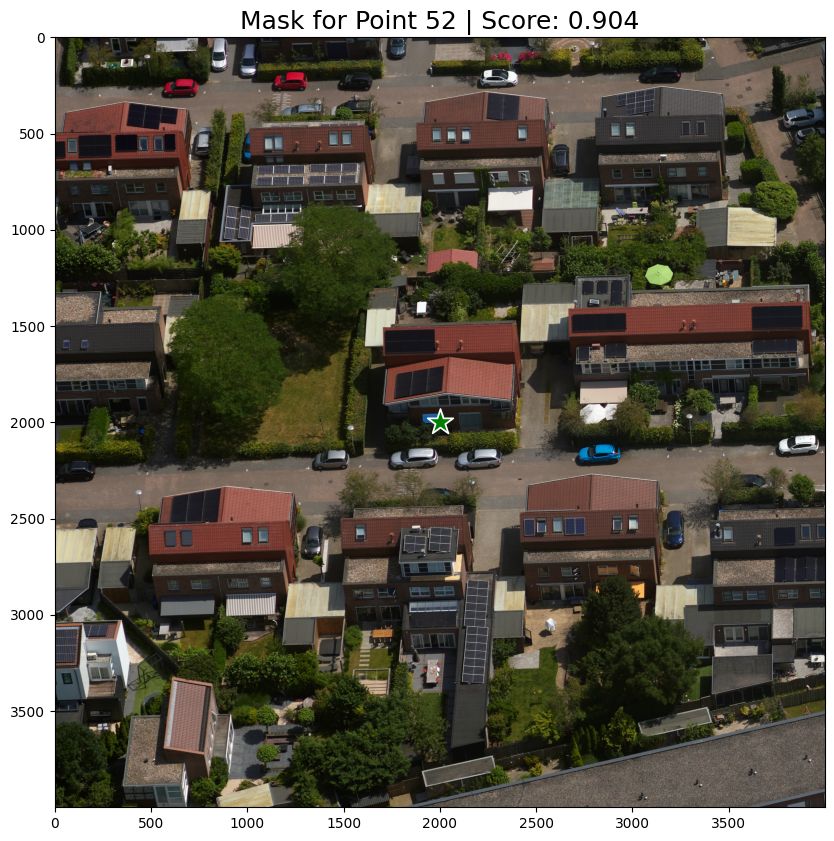

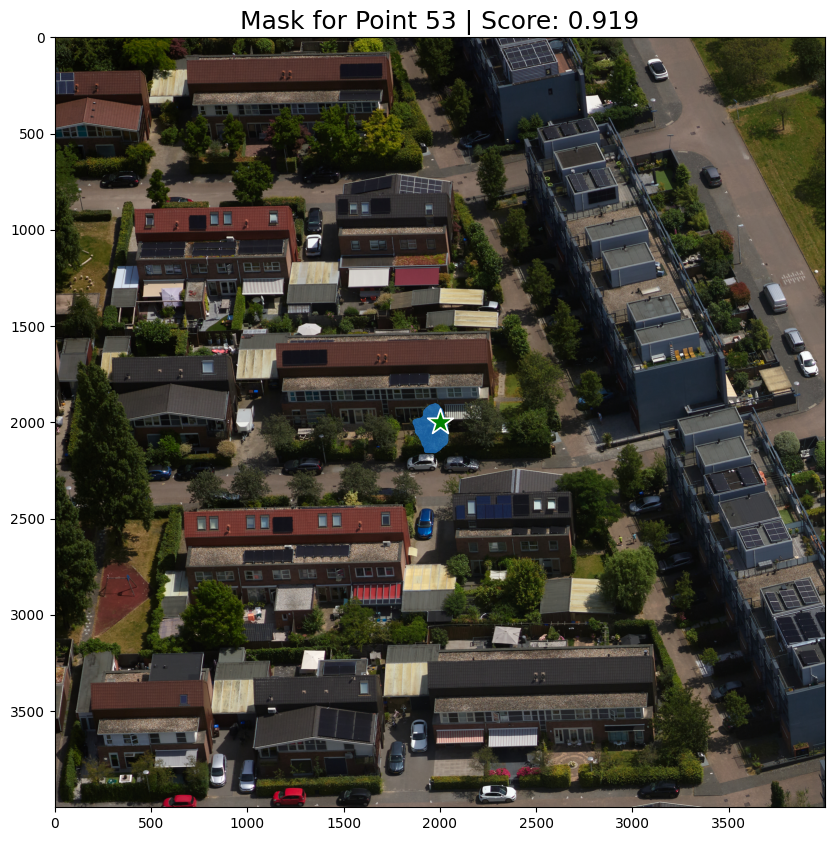

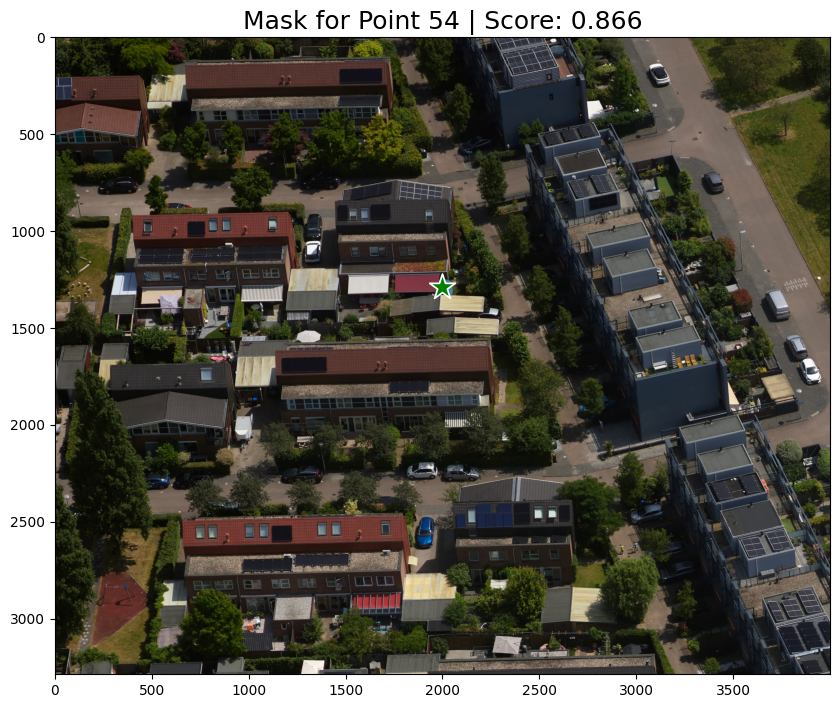

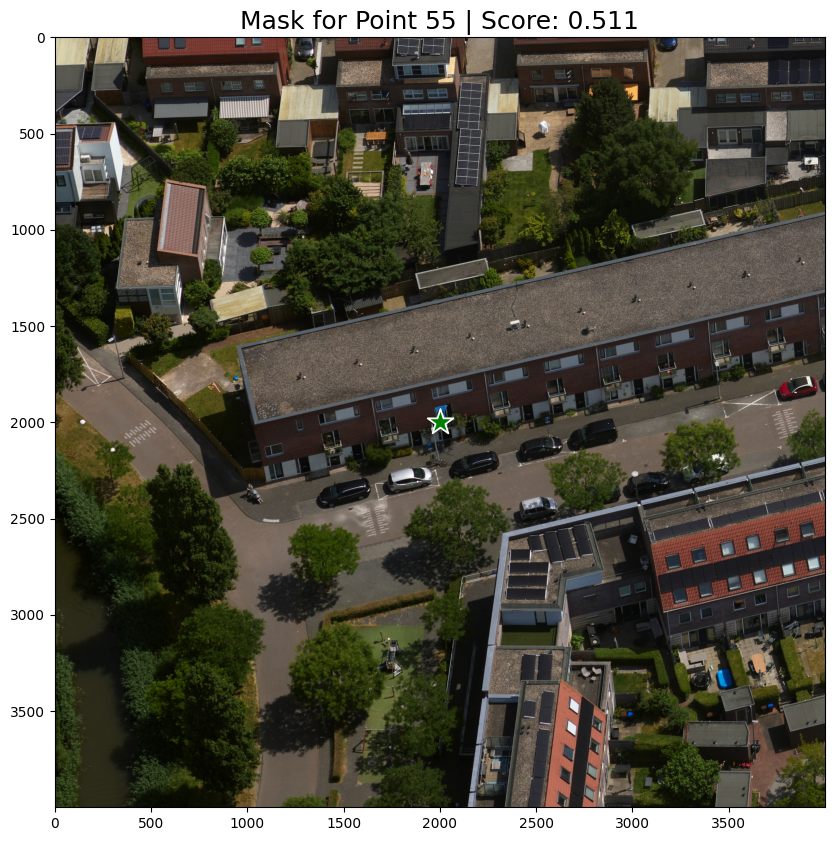

...

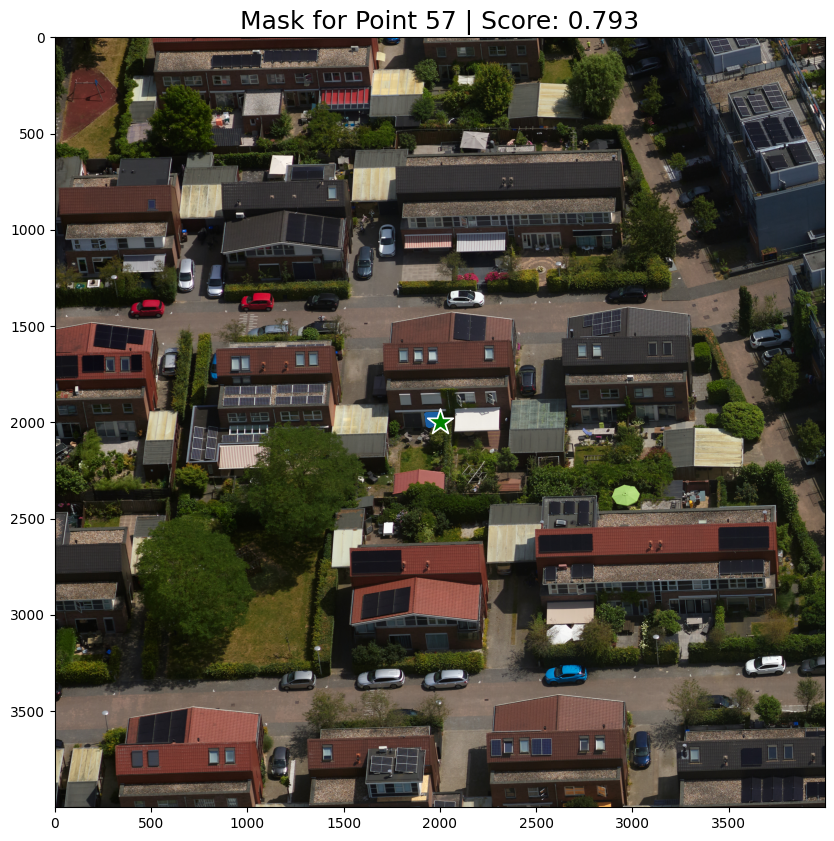

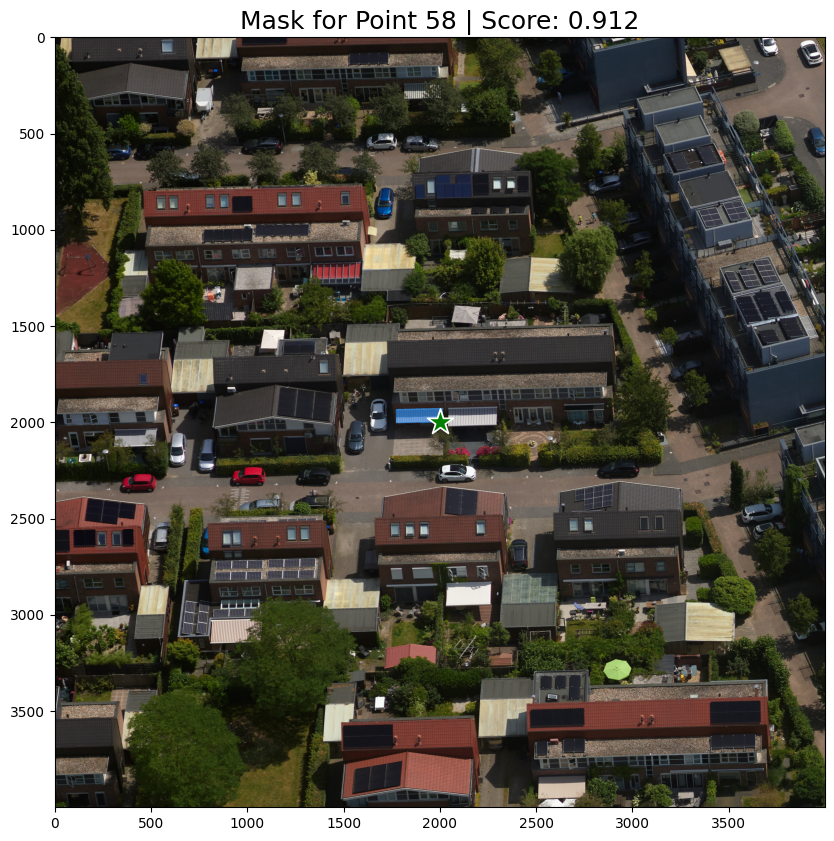

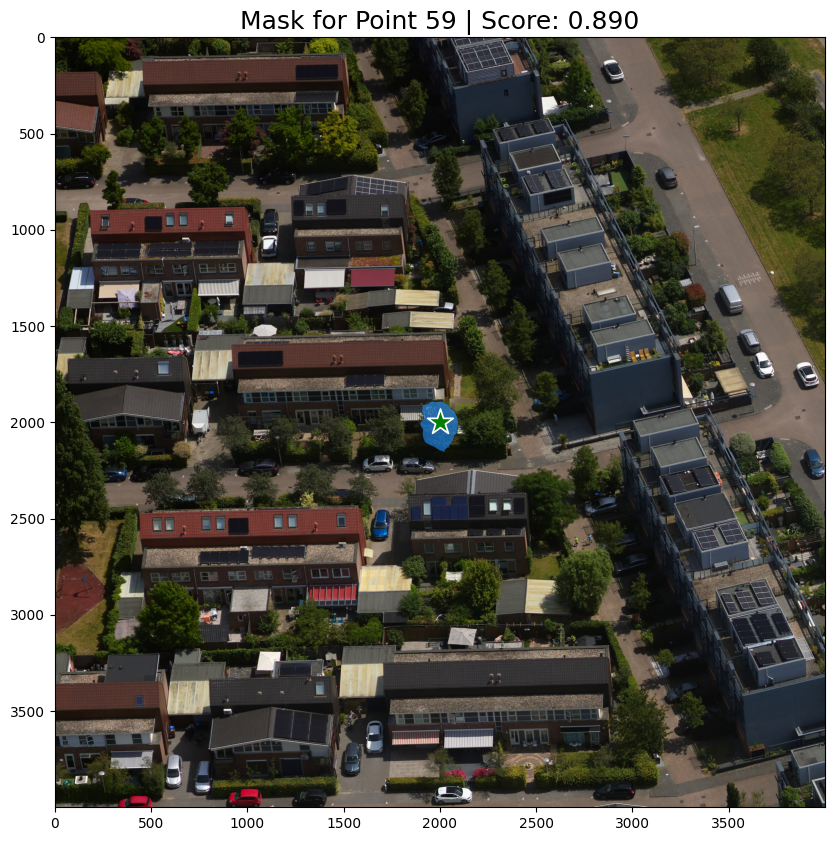

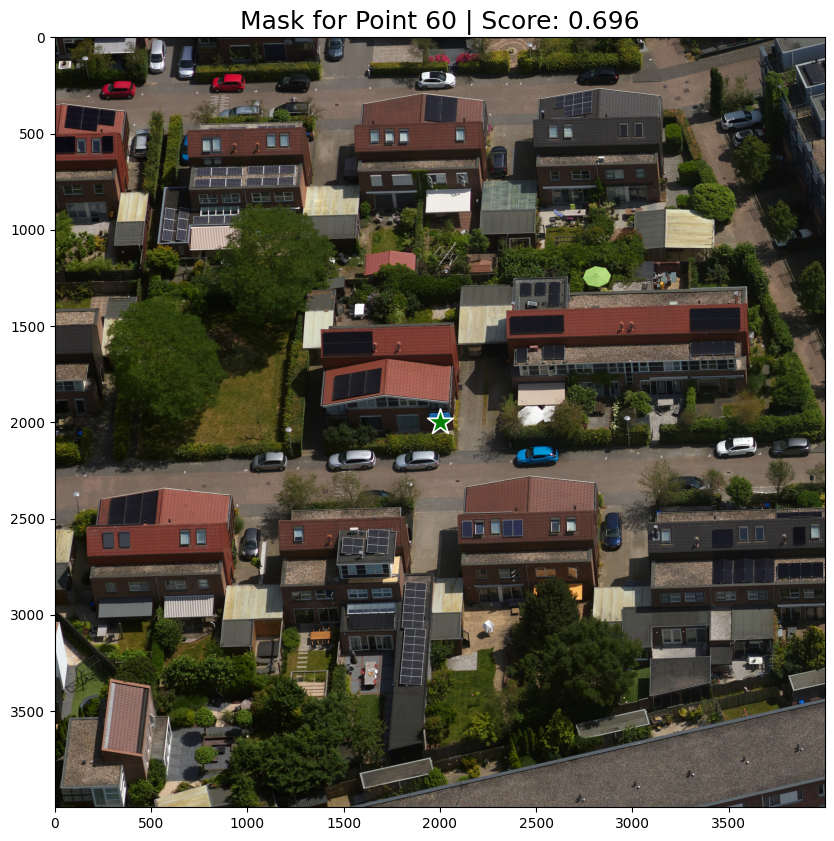

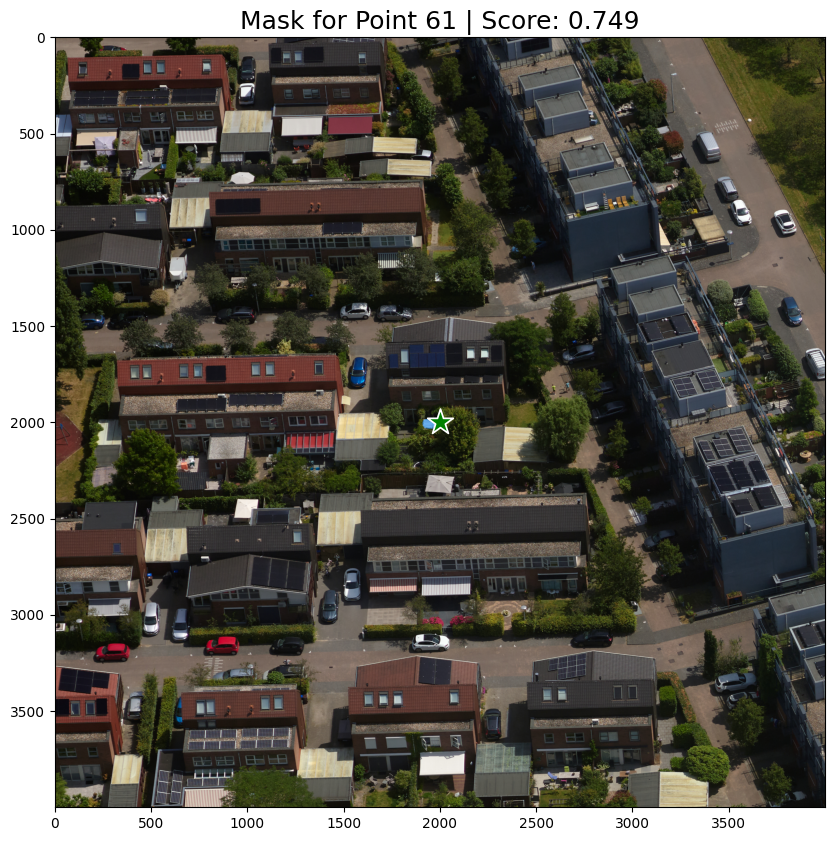

In [48]:
# Iterate over the points from the coordinates
for i, point in enumerate(coords):
    if i < 50 or i > 60:
        continue  # Skip points that are outside the specified range

    # Crop the original image with a 1000px buffer around the point
    cropped_image, cropped_point = crop_image_with_buffer(image, point, buffer_size=2000)

    # Set the cropped image to the SAM model
    predictor.set_image(cropped_image)

    # Run segmentation on the cropped image using the adjusted point coordinates
    masks, scores, _ = predictor.predict(point_coords=cropped_point, point_labels=np.array([1]), multimask_output=False)

    # Display results for the cropped image segmentation
    plt.figure(figsize=(10, 10))
    plt.imshow(cropped_image)
    show_mask(masks[0], plt.gca())  # Show segmentation mask
    show_points(cropped_point, np.array([1]), plt.gca())  # Show the prompt point on the image
    plt.title(f"Mask for Point {i+1} | Score: {scores[0]:.3f}", fontsize=18)
    plt.axis("on")  # Keep axis visible
    plt.show()
